<a href="https://colab.research.google.com/github/RyanNguyen1511/MiamiHousingMLDataAnalysis/blob/main/Miami_Housing_ML_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install openml
import openml as oml
import pandas as pd
import numpy as np
import sklearn.tree as tree
import seaborn as sn
import sklearn.model_selection as ms
import csv
import io
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,r2_score,recall_score,confusion_matrix
from sklearn.datasets import make_blobs

from sklearn.model_selection import train_test_split
from sklearn.metrics._plot.roc_curve import roc_curve

import sklearn.ensemble as ens
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit,ShuffleSplit
# from google.colab import files


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 140 kB 7.3 MB/s 
     |████████████████████████████████| 76 kB 1.5 MB/s 
  Created wheel for liac-arff: filename=liac_arff-2.5.0-py3-none-any.whl size=11732 sha256=dab48362b66403b33b9b19093c350b69d7f0ef0b288535592908b96660039be4
  Stored in directory: /root/.cache/pip/wheels/a2/de/68/bf3972de3ecb31e32bef59a7f4c75f0687a3674c476b347c14
Successfully built liac-arff


In [ ]:
oml.config.server = 'https://www.openml.org/api/v1/'
oml.config.apikey = 'a761ce0a0c728154f8465d5c42b24c4e'

In [ ]:
from sklearn.datasets import fetch_openml
# dataset = fetch_openml("poker-hand" )
dataset = fetch_openml("MiamiHousing2016" )

/usr/local/lib/python3.8/dist-packages/sklearn/datasets/_openml.py:417: UserWarning: Multiple active versions of the dataset matching the name miamihousing2016 exist. Versions may be fundamentally different, returning version 1.
  warn(


In [ ]:
# set value for dataFrame
df = dataset.data

In [ ]:
df.describe()
# df.describe().to_csv('data.csv')
# from google.colab import files
# files.download("data.csv")

,LATITUDE,LONGITUDE,PARCELNO,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
count,13932.000000,13932.000000,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,25.728811,-80.327475,2.356496e+12,8620.879917,2058.044574,9562.493468,8348.548715,31690.993798,11960.285235,68490.327132,41115.047265,7723.770693,30.669251,0.014930,6.655828,3.513997
std,0.140633,0.089199,1.199290e+12,6070.088742,813.538535,13890.967782,6178.027333,17595.079468,11932.992369,32008.474808,22161.825935,6068.936108,21.153068,0.121276,3.301523,1.097444
min,25.434333,-80.542172,1.020008e+11,1248.000000,854.000000,0.000000,10.500000,236.100000,0.000000,3825.600000,1462.800000,90.200000,0.000000,0.000000,1.000000,1.000000
25%,25.620056,-80.403278,1.079160e+12,5400.000000,1470.000000,810.000000,3299.450000,18079.350000,2675.850000,42823.100000,23996.250000,2998.125000,14.000000,0.000000,4.000000,2.000000
50%,25.731810,-80.338911,3.040300e+12,7500.000000,1877.500000,2765.500000,7106.300000,28541.750000,6922.600000,65852.400000,41109.900000,6159.750000,26.000000,0.000000,7.000000,4.000000
75%,25.852269,-80.258019,3.060170e+12,9126.250000,2471.000000,12352.250000,12102.600000,44310.650000,19200.000000,89358.325000,53949.375000,10854.200000,46.000000,0.000000,9.000000,4.000000
max,25.974382,-80.119746,3.660170e+12,57064.000000,6287.000000,175020.000000,29621.500000,75744.900000,50399.800000,159976.500000,110553.800000,48167.300000,96.000000,1.000000,12.000000,5.000000


In [ ]:
df.head(5)

,LATITUDE,LONGITUDE,PARCELNO,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
0,25.891031,-80.160561,6.222801e+11,9375.0,1753.0,0.0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67.0,0.0,8.0,4.0
1,25.891324,-80.153968,6.222801e+11,9375.0,1715.0,0.0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63.0,0.0,9.0,4.0
2,25.891334,-80.153740,6.222801e+11,9375.0,2276.0,49206.0,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61.0,0.0,2.0,4.0
3,25.891765,-80.152657,6.222801e+11,12450.0,2058.0,10033.0,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63.0,0.0,9.0,4.0
4,25.891825,-80.154639,6.222801e+11,12800.0,1684.0,16681.0,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42.0,0.0,7.0,4.0


In [ ]:
X = df.drop(['PARCELNO'],axis=1).values
y = dataset.target

In [ ]:
df.drop(['PARCELNO'],axis=1).columns

Index(['LATITUDE', 'LONGITUDE', 'LND_SQFOOT', 'TOT_LVG_AREA', 'SPEC_FEAT_VAL',
       'RAIL_DIST', 'OCEAN_DIST', 'WATER_DIST', 'CNTR_DIST', 'SUBCNTR_DI',
       'HWY_DIST', 'age', 'avno60plus', 'month_sold', 'structure_quality'],
      dtype='object')

# Visualize data to prepare for analyzing

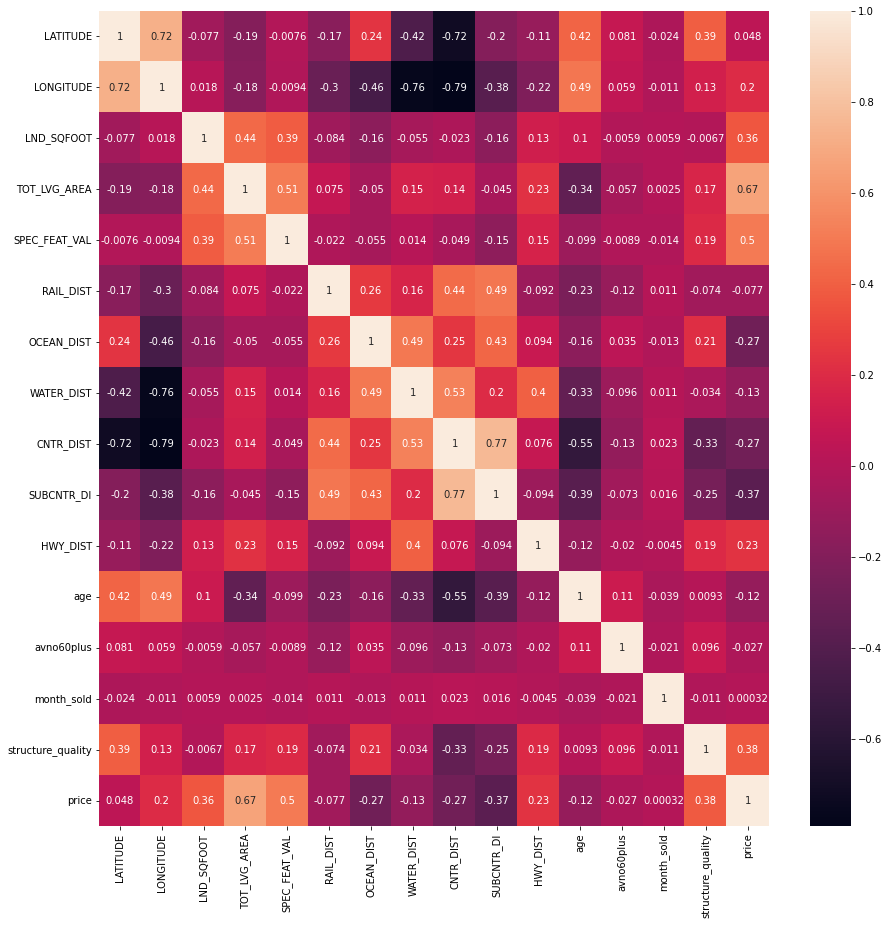

In [ ]:
corrs = np.corrcoef(X,y,rowvar =False)
fig,ax = plt.subplots(figsize=(15,15))
x_axis_labels =df.drop(['PARCELNO'],axis=1).columns.append(pd.Index(['price']))
y_axis_labels =df.drop(['PARCELNO'],axis=1).columns.append(pd.Index(['price']))
s = sn.heatmap(corrs,annot =True,xticklabels=x_axis_labels, yticklabels=y_axis_labels)

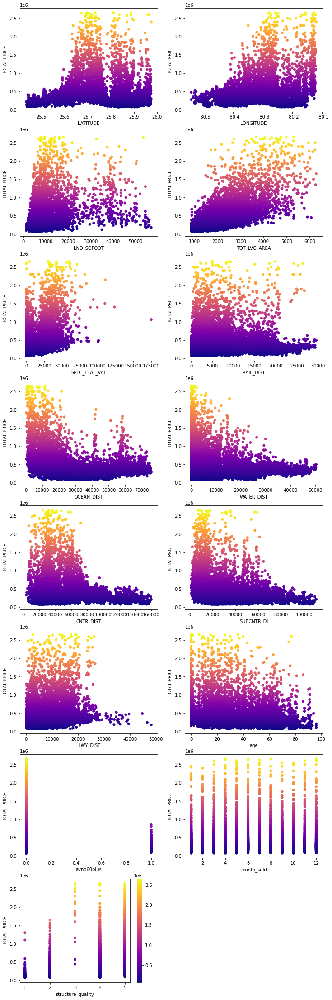

In [ ]:
n = X.shape[1]
plt.figure(figsize=[12, 5*n])
# Plots all variables in pairs (chosen arbitrarily by order in table)
for i in range(n):
  x_ax = i
  #y_ax = i+1
  # y_ax = i*2
  plt.subplot(n, 2, i+1)
  plt.scatter(X[:, x_ax], y, c=y, s=25,cmap="plasma")
  plt.xlabel(df.drop(['PARCELNO'],axis=1).columns[x_ax])
  plt.ylabel('TOTAL PRICE')

plt.colorbar()
plt.show()

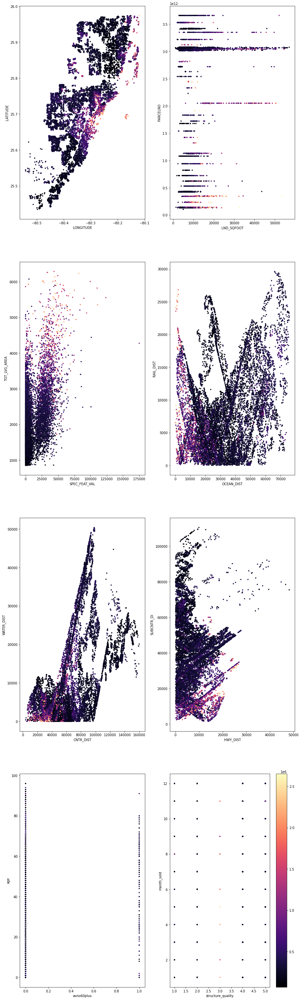

In [ ]:
n = X.shape[1]
plt.figure(figsize=[15, 7*n])

# Plots all variables in pairs (chosen arbitrarily by order in table)
for i in range(n//2):
  x_ax = i*2+1
  y_ax = i*2
  plt.subplot(n//2, 2, i+1)
  plt.scatter(X[:, x_ax], X[:, y_ax], c=y, s=7,cmap="magma")
  plt.xlabel(df.columns[x_ax])
  plt.ylabel(df.columns[y_ax])

plt.colorbar()
plt.show()

# PCA


Note: 

In [ ]:
PCA_X = X
PCA_y = y
PCA_df = df.drop(['PARCELNO'],axis=1)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(PCA_X,PCA_y)

PCA()

In [ ]:
PCA_df = df.drop(['PARCELNO'],axis=1).values
#print(df.drop(['PARCELNO'],axis=1).columns)
#print(pca.components_)
print(pd.DataFrame(pca.components_,columns=df.drop(['PARCELNO'],axis=1).columns))

   LATITUDE     LONGITUDE  LND_SQFOOT  TOT_LVG_AREA  SPEC_FEAT_VAL  RAIL_DIST  \
0 -0.000002 -1.721599e-06   -0.016073      0.001342      -0.043380   0.080464   
1  0.000005 -2.621361e-07   -0.081525     -0.008774      -0.132540   0.030025   
2 -0.000003 -2.768403e-06    0.135840      0.025293       0.629211  -0.030284   
3  0.000004  2.313834e-06    0.117645      0.016281       0.737146   0.073741   
4  0.000003  2.946590e-06   -0.085797      0.002541       0.019273  -0.315785   

   OCEAN_DIST  WATER_DIST  CNTR_DIST  SUBCNTR_DI  HWY_DIST       age  \
0    0.191722    0.161243   0.814173    0.515462  0.006971 -0.000287   
1    0.882645    0.164522  -0.367676    0.182431  0.014554  0.000129   
2    0.202794    0.479477   0.205180   -0.490022  0.175613 -0.000241   
3    0.026625   -0.421979  -0.183005    0.466456 -0.085003 -0.000005   
4   -0.256859    0.354341  -0.242640    0.406843  0.690370 -0.000037   

     avno60plus  month_sold  structure_quality  
0 -3.668268e-07    0.000002    

In [ ]:
pca.explained_variance_ratio_

array([6.37173435e-01, 1.36615073e-01, 1.01085245e-01, 7.46710197e-02,
       1.61174621e-02, 1.37364978e-02, 1.16384635e-02, 8.78181128e-03,
       1.80875738e-04, 1.11715420e-07, 4.77990618e-09, 3.60246008e-10,
       6.23420875e-12, 1.07404044e-12, 6.44407781e-14])

In [ ]:
from sklearn.model_selection import train_test_split
PCA_X_train, PCA_X_test, PCA_y_train, PCA_y_test = train_test_split(PCA_X, PCA_y, test_size=0.3)

In [ ]:
pca = PCA(0.96)
pca.fit(PCA_X_train)
PCA_X_train = pca.transform(PCA_X_train)
PCA_X_test = pca.transform(PCA_X_test)

In [ ]:
PCA_X_train.shape

(9752, 5)

In [ ]:
#show pca variance ratio
pca.explained_variance_ratio_

array([0.63717133, 0.13672547, 0.10179653, 0.07451943, 0.01600464])

Got 5 variance ratio: PC1 provide 63.8% , PC2 13.63% and PC3 10.1% ,...

In [ ]:
print(pd.DataFrame(pca.components_,columns=df.drop(['PARCELNO'],axis=1).columns))

   LATITUDE     LONGITUDE  LND_SQFOOT  TOT_LVG_AREA  SPEC_FEAT_VAL  RAIL_DIST  \
0 -0.000002 -1.727214e-06   -0.017001      0.001441      -0.037704   0.080525   
1  0.000005 -2.221926e-07   -0.088805     -0.009429      -0.135007   0.031802   
2 -0.000002 -2.620160e-06    0.141888      0.025830       0.677053  -0.026469   
3  0.000004  2.463248e-06    0.107849      0.014086       0.693224   0.073190   
4  0.000003  2.967584e-06   -0.100377      0.001072       0.025767  -0.288419   

   OCEAN_DIST  WATER_DIST  CNTR_DIST  SUBCNTR_DI  HWY_DIST       age  \
0    0.193463    0.161085   0.814426    0.514872  0.006555 -0.000292   
1    0.880287    0.157990  -0.370668    0.188239  0.009568  0.000131   
2    0.213034    0.449743   0.185687   -0.458272  0.167197 -0.000245   
3    0.010438   -0.459500  -0.195525    0.493204 -0.097592  0.000008   
4   -0.260160    0.362401  -0.247254    0.410360  0.691033  0.000007   

     avno60plus    month_sold  structure_quality  
0 -3.697770e-07  1.260083e-06

Check the distribution into result of features.OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI. SPEC_FEAT_VAL provide huge affect PC3 PC4 

# Tree


In [ ]:
Tree_X = X
Tree_y = y
# Tree_y =y.astype('int')

In [ ]:
from sklearn.model_selection import train_test_split
Tree_X_train, Tree_X_test, Tree_y_train, Tree_y_test = train_test_split(Tree_X, Tree_y, test_size=0.2)

In [ ]:
from sklearn.metrics import r2_score
import sklearn.ensemble as ens


ests = tree.DecisionTreeRegressor(max_depth = 5)

est.fit(Tree_X_train, np.ravel(Tree_y_train,order='C'))
# est.fit(Tree_X_train, Tree_y_train)
Tree_y_pred = est.predict(Tree_X_test)
print( type(est), r2_score(Tree_y_test, Tree_y_pred ) )

<class 'sklearn.tree._classes.DecisionTreeRegressor'> 0.7437359416779608


In [ ]:
from sklearn.metrics import accuracy_score
clf = tree.DecisionTreeClassifier( max_depth=3 )

clf.fit(Tree_X_train, Tree_y_train)
Tree_y_pred = clf.predict(Tree_X_test)
print(accuracy_score(Tree_y_test,Tree_y_pred))

0.024040186580552566


In [ ]:
from sklearn.ensemble import BaggingRegressor

est2 = BaggingRegressor(n_estimators=10, n_jobs=-1)
# est2.fit(Tree_X_train, Tree_y_train)
est2.fit(Tree_X_train, np.ravel(Tree_y_train,order='C'))
Tree_y_pred = est2.predict(Tree_X_test)

print( r2_score(Tree_y_test, Tree_y_pred ) )

0.8998005728800178


In [ ]:
from sklearn.ensemble import RandomForestRegressor

est3 = RandomForestRegressor(max_features=0.5)
est3.fit(Tree_X_train, np.ravel(Tree_y_train,order='C'))
Tree_y_pred = est3.predict(Tree_X_test)

print( r2_score(Tree_y_test, Tree_y_pred ) )

0.9121103667351161


In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

est4 = ExtraTreesRegressor(max_features=0.5)
est4.fit(Tree_X_train, np.ravel(Tree_y_train,order='C'))
Tree_y_pred = est4.predict(Tree_X_test)

print( r2_score(Tree_y_test, Tree_y_pred ) )

0.9181168279907792


In [ ]:
len(est3.estimators_)

100

#### DRAW tree


In [ ]:
Tree_X = X
Tree_y = y

In [ ]:
from sklearn.model_selection import train_test_split
Tree_X_train, Tree_X_test, Tree_y_train, Tree_y_test = train_test_split(Tree_X, Tree_y, test_size=0.2)

In [ ]:
from sklearn.metrics import r2_score

est = tree.DecisionTreeRegressor(max_depth = 4)


est.fit(Tree_X_train, np.ravel(Tree_y_train,order='C'))
Tree_y_pred = est.predict(Tree_X_test)
print( type(est), r2_score(Tree_y_test, Tree_y_pred ) )

<class 'sklearn.tree._classes.DecisionTreeRegressor'> 0.6809090672904861


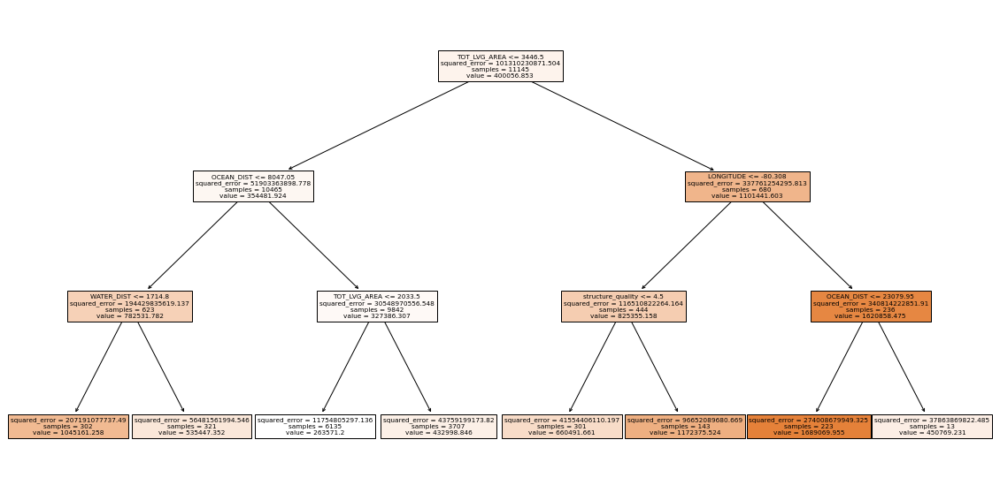

In [ ]:
plt.figure( figsize=(20,10))

_ = tree.plot_tree( est, 
                    feature_names= df.drop(['PARCELNO'],axis=1).columns,
                    class_names = 'Housing price',
                   filled = True)

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
Tree_y = Tree_y.values.reshape(-1,1)
scl_y = MinMaxScaler()
scl_y.fit_transform(Tree_y)
Tree_y = scl_y.transform(Tree_y)

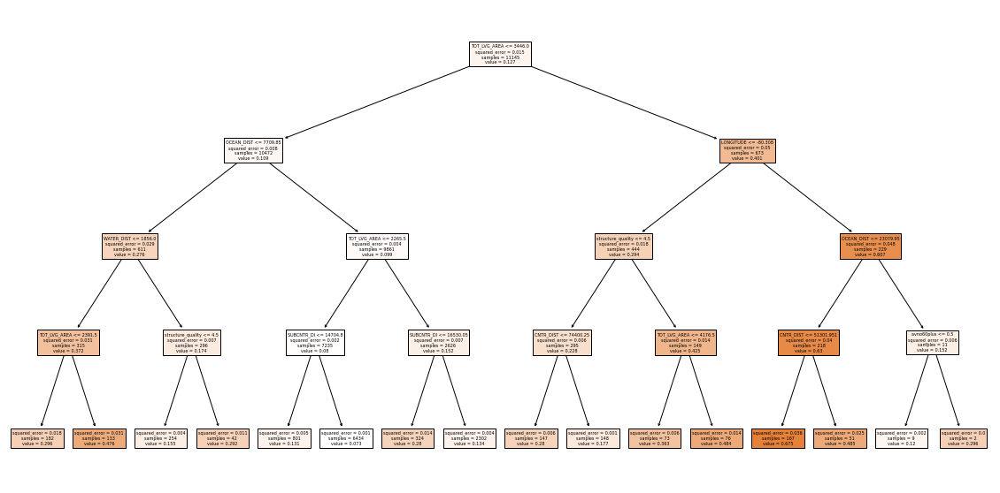

In [ ]:
plt.figure( figsize=(20,10))

_ = tree.plot_tree( est, 
                    feature_names= df.drop(['PARCELNO'],axis=1).columns,
                    class_names = 'Housing price',
                   filled = True)

In [ ]:
!pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 1.0 MB/s 


In [ ]:
from dtreeviz.trees import dtreeviz

viz = dtreeviz(est, Tree_X, Tree_y, feature_names = df.drop(['PARCELNO'],axis=1).columns, title = " Housing Price Decision Tree", scale= 1.5 )

viz

#RANDOM FORESTS

In [ ]:
ran_X =X
ran_y = y
ran_y =y.astype('int')

In [ ]:
from sklearn.model_selection import train_test_split
ran_X_train,ran_X_test, ran_y_train, ran_y_test = train_test_split(ran_X, ran_y, test_size=0.2)

In [ ]:
from sklearn.metrics import r2_score
import sklearn.ensemble as ens

ests = [tree.DecisionTreeRegressor(max_depth = 5),
         ens.BaggingRegressor(),
         ens.ExtraTreesRegressor(),
        ens.RandomForestRegressor()]
#ests = tree.DecisionTreeRegressor(max_depth = 5)
for est in ests:
  est.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  # est.fit(Tree_X_train, Tree_y_train)
  ran_y_pred = est.predict(ran_X_test)
  print( type(est), r2_score(ran_y_test, ran_y_pred ) )

<class 'sklearn.tree._classes.DecisionTreeRegressor'> 0.7312055852502952
<class 'sklearn.ensemble._bagging.BaggingRegressor'> 0.8902302399810511
<class 'sklearn.ensemble._forest.ExtraTreesRegressor'> 0.9146120101030184
<class 'sklearn.ensemble._forest.RandomForestRegressor'> 0.9018880571261622


In [ ]:
from sklearn.metrics import r2_score
import sklearn.ensemble as ens


est = ens.ExtraTreesRegressor()

est.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
# est.fit(Tree_X_train, Tree_y_train)
ran_y_pred = est.predict(ran_X_test)
print( type(est), r2_score(ran_y_test, ran_y_pred ) )

<class 'sklearn.ensemble._forest.ExtraTreesRegressor'> 0.9125977725607441


In [ ]:
from sklearn.metrics import r2_score
import sklearn.ensemble as ens


est = ens.RandomForestRegressor()

est.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
# est.fit(Tree_X_train, Tree_y_train)
ran_y_pred = est.predict(ran_X_test)
print( type(est), r2_score(ran_y_test, ran_y_pred ) )

<class 'sklearn.ensemble._forest.RandomForestRegressor'> 0.9017367133812813


In [ ]:
from sklearn.ensemble import RandomForestRegressor

for i in np.arange(0.1,1,0.1):
  est3 = RandomForestRegressor(max_features=i)
  est3.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est3.predict(ran_X_test)
  print("MAX FEATURES", round(i,1)," => ", r2_score(ran_y_test, ran_y_pred ) )

MAX FEATURES 0.1  =>  0.9027844668633839
MAX FEATURES 0.2  =>  0.9205882969355734
MAX FEATURES 0.3  =>  0.9265765144553824
MAX FEATURES 0.4  =>  0.9265120534212997
MAX FEATURES 0.5  =>  0.9251772627779817
MAX FEATURES 0.6  =>  0.9241145298645566
MAX FEATURES 0.7  =>  0.9231733569061805
MAX FEATURES 0.8  =>  0.9202240852297965
MAX FEATURES 0.9  =>  0.9187922932490923


In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

for i in np.arange(0.1,1,0.1):
  est4 = ExtraTreesRegressor(max_features=i)
  est4.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est4.predict(ran_X_test)
  print("MAX FEATURES", round(i,1)," => ", r2_score(ran_y_test, ran_y_pred ) )

MAX FEATURES 0.1  =>  0.9312106038335468
MAX FEATURES 0.2  =>  0.9309176977645657
MAX FEATURES 0.3  =>  0.9330360290724798
MAX FEATURES 0.4  =>  0.9326493196091176
MAX FEATURES 0.5  =>  0.9320483876590214
MAX FEATURES 0.6  =>  0.9326295121379262
MAX FEATURES 0.7  =>  0.9309755158625448
MAX FEATURES 0.8  =>  0.9307463543441267
MAX FEATURES 0.9  =>  0.9321258199973652


IT does not much difference between max_features we tried again with the n_estimator, try to optimize the number of tree

Number of tree 50  =>  0.9101280254121827
Number of tree 100  =>  0.9132373331485074
Number of tree 150  =>  0.9167550123017778
Number of tree 200  =>  0.9159306991152376
Number of tree 250  =>  0.9174270210627165
Number of tree 300  =>  0.9168454588112791
Number of tree 350  =>  0.9157444242944097
Number of tree 400  =>  0.9158613100722619
Number of tree 450  =>  0.9165615096614432
Number of tree 500  =>  0.9160172102404613
Number of tree 550  =>  0.9168378601995488
Number of tree 600  =>  0.9159340659076047
Number of tree 650  =>  0.9164861522060987
Number of tree 700  =>  0.9164752146118624
Number of tree 750  =>  0.9160685218317541
Number of tree 800  =>  0.9175561725700463
Number of tree 850  =>  0.916107461484789
Number of tree 900  =>  0.9169965220201518
Number of tree 950  =>  0.9162832592977389
Number of tree 1000  =>  0.9163506071558424


Text(0, 0.5, 'r2_score')

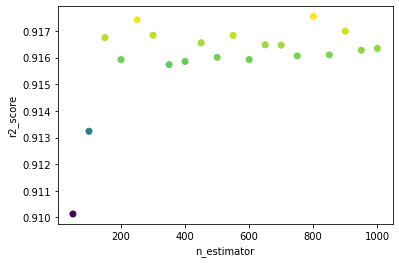

In [ ]:
from sklearn.ensemble import RandomForestRegressor

random_score_list =[]
randomEstimatorList = []
for i in np.arange(50,1050,50):
  est3 = RandomForestRegressor(n_estimators=i)
  est3.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est3.predict(ran_X_test)
  print("Number of tree", round(i,1)," => ", r2_score(ran_y_test, ran_y_pred ) )
  random_score_list.append(r2_score(ran_y_test, ran_y_pred ))
  randomEstimatorList.append(i)

plt.scatter(randomEstimatorList, random_score_list, c=random_score_list)
plt.xlabel('n_estimator')
plt.ylabel('r2_score')

Number of tree 50  =>  0.9275483757688716
Number of tree 100  =>  0.9332782867780344
Number of tree 150  =>  0.9325769058372804
Number of tree 200  =>  0.930815020208257
Number of tree 250  =>  0.931763126562746
Number of tree 300  =>  0.9324345506402968
Number of tree 350  =>  0.9328384664830862
Number of tree 400  =>  0.932580827246701
Number of tree 450  =>  0.9326901539419613
Number of tree 500  =>  0.9330325533726065
Number of tree 550  =>  0.9318851102999739
Number of tree 600  =>  0.9320956666861463
Number of tree 650  =>  0.9324611403155826
Number of tree 700  =>  0.932764655249593
Number of tree 750  =>  0.932844724466281
Number of tree 800  =>  0.9322966293075319
Number of tree 850  =>  0.9330853275439696
Number of tree 900  =>  0.932668151402625
Number of tree 950  =>  0.9327169487689595
Number of tree 1000  =>  0.9323684933484827


Text(0, 0.5, 'r2_score')

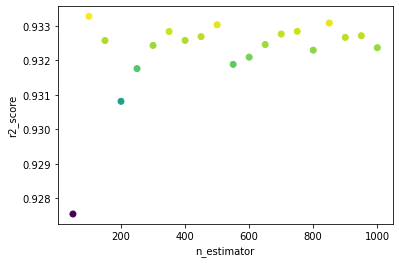

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

random_score_list =[]
randomEstimatorList = []
for i in np.arange(50,1050,50):
  est3 = ExtraTreesRegressor(n_estimators=i)
  est3.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est3.predict(ran_X_test)
  print("Number of tree", round(i,1)," => ", r2_score(ran_y_test, ran_y_pred ) )
  random_score_list.append(r2_score(ran_y_test, ran_y_pred ))
  randomEstimatorList.append(i)

plt.scatter(randomEstimatorList, random_score_list, c=random_score_list)
plt.xlabel('n_estimator')
plt.ylabel('r2_score')

It doesnot much difference , i decide to user n_estimator =100

### Tuning Hyperparameters

####RandomForestRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 800, num = 10)]
# Number of features to consider at every split
max_features = [0.1,0.2,0.3,0.4]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(ran_X_train, np.ravel(ran_y_train,order='C'))


{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': [0.1, 0.2, 0.3, 0.4],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 266, 333, 400, 466, 533, 600, 666, 733, 800]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': [0.1, 0.2, 0.3, 0.4],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 266, 333, 400,
                                                         466, 533, 600, 666,
                                                         733, 800]},
                   random_state=42, verbose=2)

In [ ]:
# check the best combination of parameter
rf_random.best_params_

{'n_estimators': 466,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 0.3,
 'max_depth': None,
 'bootstrap': False}

In [ ]:
from sklearn.ensemble import RandomForestRegressor

est3 = RandomForestRegressor(n_estimators =466, 
                               min_samples_leaf=1,
                               min_samples_split=2,
                               max_features=0.3,
                               max_depth=None, 
                               bootstrap=False)
est3.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
ran_y_pred = est3.predict(ran_X_test)
print("RandomForestRegressor R-square score => ", r2_score(ran_y_test, ran_y_pred ) )

RandomForestRegressor R-square score =>  0.9128577730274777


In [ ]:
#Grid Search with Cross Validation Randomforests Regressor
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [100, 90, 100, 110],
    'max_features': [0.1,0.2,0.3, 0.4],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(ran_X_train, np.ravel(ran_y_train,order='C'))


####ExtraTreesRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 800, num = 10)]
# Number of features to consider at every split
max_features = [0.1,0.2,0.3, 0.4]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = ExtraTreesRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(ran_X_train, np.ravel(ran_y_train,order='C'))

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': [0.1, 0.2, 0.3, 0.4],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 266, 333, 400, 466, 533, 600, 666, 733, 800]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:703: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


RandomizedSearchCV(cv=3, estimator=ExtraTreesRegressor(), n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': [0.1, 0.2, 0.3, 0.4],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 266, 333, 400,
                                                         466, 533, 600, 666,
                                                         733, 800]},
                   random_state=42, verbose=2)

In [ ]:
# check the best combination of parameter
rf_random.best_params_

{'n_estimators': 466,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 0.3,
 'max_depth': None,
 'bootstrap': False}

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

est4 = ExtraTreesRegressor(n_estimators =466, 
                               min_samples_leaf=1,
                               min_samples_split=2,
                               max_features=0.3,
                               max_depth=None, 
                               bootstrap=False)
est4.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
ran_y_pred = est4.predict(ran_X_test)
print("ExtraTreesRegressor R-square score => ", r2_score(ran_y_test, ran_y_pred ) )

ExtraTreesRegressor R-square score =>  0.914262413918588


### CROSS VALIDATION

In [ ]:
#cv = KFold(n_splits = 5, shuffle=True)
cv = ShuffleSplit(n_splits = 10, test_size = 0.3)

for train_index, test_index in cv.split(ran_X,ran_y):
  print(train_index, "/", test_index)

[ 2125  1911 13660 ... 12069  4215  6358] / [13325  8977 11522 ...  7693  7119  6844]
[11354  2356 12233 ...  9952  2071  1703] / [ 6701  4145  8086 ...  1432  1743 12072]
[   67  6896  2938 ... 10685  5954 11183] / [ 7245 12126 13005 ...  2817   737  2087]
[ 4963  9087  7699 ... 10821 11942 13819] / [ 1206 11773  5512 ...    84 13221  2871]
[6824 6630 8777 ... 4693 7614 8789] / [10142  2176  6468 ...  2237 13088  1677]
[9999 5560 1427 ... 1576 6773 4935] / [8659 1302 8997 ... 9458 6205 3269]
[  334  1752  1712 ... 13528   257 12828] / [   12 11661  4781 ...  3367   282 12799]
[ 2482 13314 11686 ...  8759  3881  9114] / [ 4575  6987  8730 ...  7539 12535 10512]
[8749 8642  402 ... 4570 7616 3264] / [11760 10229  3560 ...  9642  8395  9857]
[10189 10179  8421 ...   216 13182  8392] / [11915  5966  8365 ...    41  3649  5103]


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics

scores_randomforest=[]
scores_extraTree=[]
for train_index, test_index in cv.split(ran_X,ran_y):
  ran_X_train, ran_X_test = ran_X[train_index], ran_X[test_index]
  ran_y_train, ran_y_test = ran_y.astype('int')[train_index], ran_y.astype('int')[test_index]
  est5 = RandomForestRegressor(n_estimators =466, 
                               min_samples_leaf=1,
                               min_samples_split=2,
                               max_features=0.3,
                               max_depth=None, 
                               bootstrap=False)
  est5.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est5.predict(ran_X_test)
  scores_randomforest.append( r2_score(ran_y_test, ran_y_pred) )

  est6 = ExtraTreesRegressor(n_estimators =466, 
                               min_samples_leaf=1,
                               min_samples_split=2,
                               max_features=0.3,
                               max_depth=None, 
                               bootstrap=False)
  est6.fit(ran_X_train, np.ravel(ran_y_train,order='C'))
  ran_y_pred = est6.predict(ran_X_test)
  scores_extraTree.append( r2_score(ran_y_test, ran_y_pred) )



for i in range(len(scores_randomforest)):  
  print("RandomForestRegressor Accuracy", i," : ",scores_randomforest[i])

for i in range(len(scores_extraTree)):  
  print("ExtraTreesRegressor Accuracy", i," : ",scores_extraTree[i])

RandomForestRegressor Accuracy 0  :  0.9184156011281825
RandomForestRegressor Accuracy 1  :  0.9147297610804593
RandomForestRegressor Accuracy 2  :  0.9119745331278717
RandomForestRegressor Accuracy 3  :  0.9134047110886041
RandomForestRegressor Accuracy 4  :  0.910119222632638
RandomForestRegressor Accuracy 5  :  0.9137252427128376
RandomForestRegressor Accuracy 6  :  0.9216285333629888
RandomForestRegressor Accuracy 7  :  0.9116555840338306
RandomForestRegressor Accuracy 8  :  0.9060580847964467
RandomForestRegressor Accuracy 9  :  0.9176321314943419
ExtraTreesRegressor Accuracy 0  :  0.9188440212694383
ExtraTreesRegressor Accuracy 1  :  0.9152465364776504
ExtraTreesRegressor Accuracy 2  :  0.9103174836196166
ExtraTreesRegressor Accuracy 3  :  0.9139768853561332
ExtraTreesRegressor Accuracy 4  :  0.9111615092316913
ExtraTreesRegressor Accuracy 5  :  0.9152260175032683
ExtraTreesRegressor Accuracy 6  :  0.9218924693952855
ExtraTreesRegressor Accuracy 7  :  0.9108155878151123
ExtraTree

# ADABOOST

In [ ]:
ada_X =X
ada_y = y
ada_y =y.astype('int')
# ada_X_train, ada_X_test, ada_y_train, ada_y_test = train_test_split(ada_X,ada_y, test_size=0.2)


In [ ]:
from sklearn.model_selection import train_test_split
ada_X_train, ada_X_test, ada_y_train, ada_y_test = train_test_split(ada_X, ada_y, test_size=0.2)

In [ ]:
#ada_X=ada_X.reshape(-1,1)
#ada_X.shape

In [ ]:
#Running adaboost with default parameter

from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

ada = AdaBoostRegressor()
ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
ada_y_pred = ada.predict(ada_X_test)
print(" AdaBoost Regressor R2 Score : ",  r2_score(ada_y_test, ada_y_pred))

 AdaBoost Regressor R2 Score :  0.3994335936182781


In [ ]:
# Find the number of tree to Consider

from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

# define number of tree  to consider
count=0;
while(count!=5):
  tree_max =0
  index_max=0;
  for i in range(50,1000,50):
    ada = AdaBoostRegressor(n_estimators=50,learning_rate = 1)
    ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
  # ada.fit(ada_X_train, np.ravel(ada_y_train,order='C'))
    ada_y_pred = ada.predict(ada_X_test)
  # print("Accuracy:",metrics.accuracy_score(ada_y_test, ada_y_pred))
    if(tree_max < r2_score(ada_y_test, ada_y_pred)):
      tree_max = r2_score(ada_y_test, ada_y_pred)
      index_max =i
  count+=1
  print("R2 Score of ", index_max," : ", tree_max)

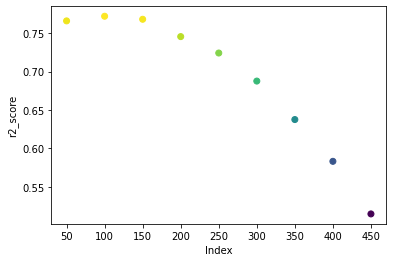

In [ ]:
# Find the number of tree to Consider

from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

# define number of tree  to consider
count=0
r2score=[]
index_score=[]
for i in range(50,500,50):
  ada = AdaBoostRegressor(n_estimators=i,learning_rate = 0.1)
  ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
# ada.fit(ada_X_train, np.ravel(ada_y_train,order='C'))
  ada_y_pred = ada.predict(ada_X_test)
  a = r2_score(ada_y_test, ada_y_pred)
  r2score.append(a)
  index_score.append(i)
# print("Accuracy:",metrics.accuracy_score(ada_y_test, ada_y_pred))
  #    if(tree_max < r2_score(ada_y_test, ada_y_pred)):
  #      tree_max = r2_score(ada_y_test, ada_y_pred)
  #      index_max =i
  # print("R2 Score of ",index_max," : ", tree_max)



plt.scatter(index_score, r2score, c=r2score)
plt.xlabel('Index')
plt.ylabel('r2_score')
count+=1;

R2 Score of learning rate   0.1  :  0.7576609327512667
R2 Score of learning rate   0.2  :  0.7654791385097942
R2 Score of learning rate   0.3  :  0.7625894178706178
R2 Score of learning rate   0.4  :  0.7306858132948253
R2 Score of learning rate   0.5  :  0.700677838303078
R2 Score of learning rate   0.6  :  0.6588283312339132
R2 Score of learning rate   0.7  :  0.6186867474658122
R2 Score of learning rate   0.8  :  0.5936619162478767
R2 Score of learning rate   0.9  :  0.5415436647062654
R2 Score of learning rate   1.0  :  0.43279526432920024
R2 Score of learning rate   1.1  :  0.5092980994418799
R2 Score of learning rate   1.2  :  0.5049901658254243
R2 Score of learning rate   1.3  :  0.3701952615605679
R2 Score of learning rate   1.4  :  0.3236126464905471
R2 Score of learning rate   1.5  :  0.41379737703115105
R2 Score of learning rate   1.6  :  0.228385528957204
R2 Score of learning rate   1.7  :  0.2917359131897129
R2 Score of learning rate   1.8  :  0.09574271241456833
R2 Score 

Text(0, 0.5, 'r2_score')

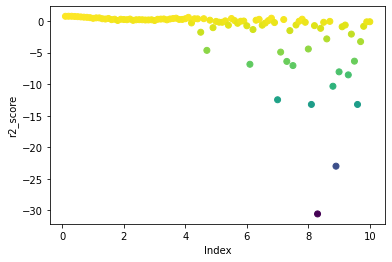

In [ ]:
#Find the number of learning rate to Consider with the n_estimator is optimized at 50
from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

r2score_learningRate=[]
index_score_learningRate=[]
for i in np.arange(0.1,10.1,0.1):
  ada = AdaBoostRegressor(n_estimators=50,learning_rate = i)
  ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
  ada_y_pred = ada.predict(ada_X_test)
  a = r2_score(ada_y_test, ada_y_pred)
  r2score_learningRate.append(a)
  index_score_learningRate.append(i)
  print("R2 Score of learning rate  ", round(i,1) ," : ", r2_score(ada_y_test, ada_y_pred))
plt.scatter(index_score_learningRate,r2score_learningRate,c=r2score_learningRate )
plt.xlabel('Index')
plt.ylabel('r2_score')


In [ ]:
#Find the number of learning rate to Consider
from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

rate_max =0;
learning_rate_Tree=0;
r2score_learningRate=[]
index_score_learningRate=[]

for i in np.arange(0.1,1.1,0.1):
  ada = AdaBoostRegressor(n_estimators=50,learning_rate = i)
  ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
  ada_y_pred = ada.predict(ada_X_test)
  a = r2_score(ada_y_test, ada_y_pred)
  r2score_learningRate.append(a)
  index_score_learningRate.append(i)
  print("learning_rate: ",round(i,1), "n_estimators : 50  : " , r2_score(ada_y_test, ada_y_pred))
  if(rate_max<r2_score(ada_y_test, ada_y_pred)):
    rate_max =r2_score(ada_y_test, ada_y_pred)
    learning_rate_Tree = i
    numberOfTree = 50

print(" MAX VALUE ")
print("learning_rate: ",learning_rate_Tree, "n_estimators : 50  => " , rate_max)

learning_rate:  0.1 n_estimators : 50  :  0.7576289407789776
learning_rate:  0.2 n_estimators : 50  :  0.7817574281979613
learning_rate:  0.3 n_estimators : 50  :  0.7575798579085592
learning_rate:  0.4 n_estimators : 50  :  0.737301943220416
learning_rate:  0.5 n_estimators : 50  :  0.6734554366009953
learning_rate:  0.6 n_estimators : 50  :  0.6413079026835256
learning_rate:  0.7 n_estimators : 50  :  0.5699248966842003
learning_rate:  0.8 n_estimators : 50  :  0.5214360454645036
learning_rate:  0.9 n_estimators : 50  :  0.445808904427641
learning_rate:  1.0 n_estimators : 50  :  0.3874566693178324
 MAX VALUE 
learning_rate:  0.2 n_estimators : 50  =>  0.7817574281979613


In [ ]:
#running again with the decided n_estimator =100 and  learning rate = 0.2
from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics
from sklearn.model_selection import KFold, LeaveOneOut,GridSearchCV, StratifiedShuffleSplit

ada = AdaBoostRegressor(n_estimators=100,learning_rate = 0.2)
ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
ada_y_pred = ada.predict(ada_X_test)
print(" AdaBoost Regressor R2 Score  with loss = linear: ",  r2_score(ada_y_test, ada_y_pred))

ada = AdaBoostRegressor(n_estimators=100,learning_rate = 0.2, loss = 'square')
ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
ada_y_pred = ada.predict(ada_X_test)
print(" AdaBoost Regressor R2 Score  with loss = square: ",  r2_score(ada_y_test, ada_y_pred))

ada = AdaBoostRegressor(n_estimators=100,learning_rate = 0.2, loss = 'exponential')
ada.fit(ada_X_train,np.ravel(ada_y_train,order='C'))
ada_y_pred = ada.predict(ada_X_test)
print(" AdaBoost Regressor R2 Score  with loss = exponential: ",  r2_score(ada_y_test, ada_y_pred))

 AdaBoost Regressor R2 Score  with loss = linear:  0.7255442303416724
 AdaBoost Regressor R2 Score  with loss = square:  0.7034784502505212
 AdaBoost Regressor R2 Score  with loss = exponential:  0.7531084686883385


###CROSS VALIDATION

In [ ]:
#cv = KFold(n_splits = 5, shuffle=True)
cv = ShuffleSplit(n_splits = 10, test_size = 0.3)

for train_index, test_index in cv.split(ada_X,ada_y):
  print(train_index, "/", test_index)

[ 1783 13138  5257 ...  6945  2020 12110] / [7270  654 3645 ...  206 8007 7711]
[ 5467 12847 12092 ...  3198  7438 10867] / [  666  2812 12543 ...  5726 12045  3255]
[13458   284 10799 ...  4166  7863 10232] / [13289  7497  8715 ...  6492   802  3020]
[ 4357  3625  6485 ... 12342  1452 13018] / [13080  9966  7562 ... 12713  4560  4583]
[ 7869  8327 12120 ...  4169 12760 12145] / [ 8826  1514  3415 ... 11531   736  7178]
[ 4444 10402  8603 ... 10599 12168  6454] / [13514 10242  6012 ...  1251   855  4801]
[ 6542 13364    89 ...  4325 11635  6268] / [12217  8813  7699 ...    48  7017  1308]
[5724 8389 9054 ...  577 9098 1086] / [ 1528 11095  2495 ...  9313  3331  1935]
[12368  9726   808 ...  8446  1446  4084] / [13652  9449  7676 ... 11681  6290  4564]
[ 5006 11992  4710 ... 11888   930  7051] / [9949 9551  965 ... 9752 3350 2013]


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn import metrics

scores=[]
i=0
for train_index, test_index in cv.split(ada_X,ada_y):
  ada_X_train, ada_X_test = ada_X[train_index], X[test_index]
  ada_y_train, ada_y_test = ada_y.astype('int')[train_index], ada_y.astype('int')[test_index]
  ada = AdaBoostRegressor(n_estimators=100,learning_rate = 0.2, loss = 'exponential')
  ada.fit(ada_X_train, np.ravel(ada_y_train,order='C'))
  ada_y_pred = ada.predict(ada_X_test)
  scores.append( r2_score(ada_y_test, ada_y_pred) )

for i in range(len(scores)):  
  print("Accuracy", i," : ",scores[i])

Accuracy 0  :  0.7759534656446121
Accuracy 1  :  0.7500551570851755
Accuracy 2  :  0.7386732305616892
Accuracy 3  :  0.7495217786674446
Accuracy 4  :  0.7636302824759931
Accuracy 5  :  0.7601466992432311
Accuracy 6  :  0.7524913216761154
Accuracy 7  :  0.7457538021518542
Accuracy 8  :  0.7575286321682282
Accuracy 9  :  0.7546729954664895


# Gradient Boosting

In [ ]:
gra_X =X
gra_y = y
gra_y =y.astype('int')

In [ ]:
# split the data set for test and training
gra_X_train, gra_X_test, gra_y_train, gra_y_test = train_test_split(gra_X,gra_y, test_size=0.2)

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingRegressor

gra=GradientBoostingRegressor(n_estimators=50,learning_rate=0.1,random_state=10,max_features=5 )
gra.fit(gra_X_train,np.ravel(gra_y_train,order='C'))
print("GBC r2 score is %2.2f" % r2_score( gra_y_test, gra.predict(gra_X_test)))

GBC r2 score is 0.90


('learning_rate: ', '0.1', 'n_estimators :', 2950, ' random_statemax : ', '10', ' =>>', 0.936049556165688)


Text(0, 0.5, 'r2_score')

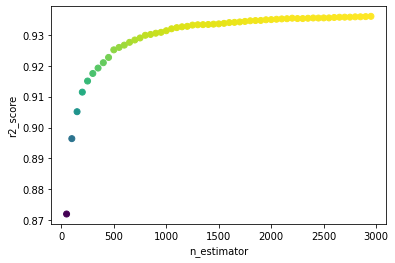

In [ ]:
# Test the gradient boosting with difference n_estimator

r2_score_max =0
estimator_max =0
r2_score_list=[]
estimator_list=[]

for e in range(50,3000,50):
  gra=GradientBoostingRegressor(n_estimators=e,learning_rate=0.1,random_state=10,max_features=5 )
  gra.fit(gra_X_train,np.ravel(gra_y_train,order='C'))
  r2_score_list.append(r2_score(gra_y_test, gra.predict(gra_X_test)))
  estimator_list.append(e)
  if(r2_score_max<r2_score(gra_y_test, gra.predict(gra_X_test))):
     r2_score_max = r2_score(gra_y_test, gra.predict(gra_X_test))
     estimator_max =e

print(("learning_rate: ","0.1", "n_estimators :",estimator_max, " random_statemax : " , 
       "10"," =>>" ,r2_score_max ))
plt.scatter(estimator_list,r2_score_list,c=r2_score_list )
plt.xlabel('n_estimator')
plt.ylabel('r2_score')

('learning_rate: ', 0.6, 'n_estimators :', 50, ' random_statemax : ', '10', ' =>>', 0.9052428285205978)


Text(0, 0.5, 'r2_score')

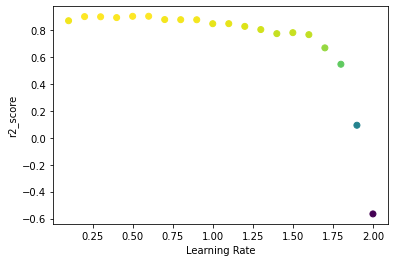

In [ ]:
# Test the gradient boosting with difference learning rate
r2_score_max =0
learningRateMax =0
r2_score_list=[]
lr_list=[]
for l in np.arange(0.1,2.1,0.1):
  gra=GradientBoostingRegressor(n_estimators=50,learning_rate=l,random_state=10,max_features=5 )
  gra.fit(gra_X_train,np.ravel(gra_y_train,order='C'))
  r2_score_list.append(r2_score(gra_y_test, gra.predict(gra_X_test)))
  lr_list.append(l)
  if(r2_score_max<r2_score(gra_y_test, gra.predict(gra_X_test))):
     r2_score_max = r2_score(gra_y_test, gra.predict(gra_X_test))
     learningRate_list =l

print(("learning_rate: ",learningRate_list, "n_estimators :",50, " random_statemax : " , 
       "10"," =>>" ,r2_score_max ))
plt.scatter(lr_list,r2_score_list, c=r2_score_list)
plt.xlabel('Learning Rate')
plt.ylabel('r2_score')

('learning_rate: ', 0.6, 'n_estimators :', 50, ' random_statemax : ', '10', ' =>>', 0.9052428285205978)


Text(0, 0.5, 'r2_score')

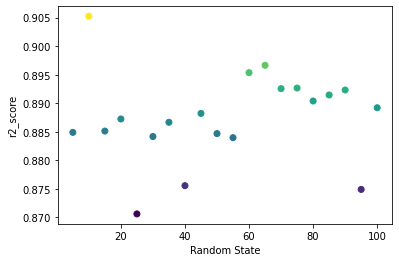

In [ ]:
# Test the gradient boosting with difference learning rate
r2_score_max =0
randomStateMax=0

r2_score_list=[]
randomStateList=[]
for r in np.arange(5,105,5):
  gra=GradientBoostingRegressor(n_estimators=50,learning_rate=0.6,random_state=r,max_features=5 )
  gra.fit(gra_X_train,np.ravel(gra_y_train,order='C'))
  r2_score_list.append(r2_score(gra_y_test, gra.predict(gra_X_test)))
  randomStateList.append(r)
  if(r2_score_max<r2_score(gra_y_test, gra.predict(gra_X_test))):
     r2_score_max = r2_score(gra_y_test, gra.predict(gra_X_test))
     randomStateMax =l

print(("learning_rate: ",0.6, "n_estimators :",50, " random_statemax : " , 
       "10"," =>>" ,r2_score_max ))
plt.scatter(randomStateList,r2_score_list, c=r2_score_list)
plt.xlabel('Random State')
plt.ylabel('r2_score')

Best parameter range for test; n_estimator from 1000 to 1500 , learning rate = 0.3 to 0.6 , random state = 10, 

### Tuning Hyperparameters

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint
n_estimators = [1000,1500]
# Number of features to consider at every split
max_features = [0.3, 0.4]
# Maximum number of depth in tree
max_depth = [5,10]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
pprint(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = GradientBoostingRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(gra_X_train, np.ravel(gra_y_train,order='C'))

{'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': [0.3, 0.4],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [1000, 1500]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [ ]:
# check the best combination of parameter
rf_random.best_params_

{'n_estimators': 1500,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 0.4,
 'max_depth': 5}

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingRegressor

gra=GradientBoostingRegressor(n_estimators=1500,
                              min_samples_split =2,
                              min_samples_leaf=1,
                              learning_rate=0.6,
                              max_features=0.4 )

gra.fit(gra_X_train,np.ravel(gra_y_train,order='C'))
print("GradientBoostingRegressor R-square score : %2.6f" % r2_score( gra_y_test, gra.predict(gra_X_test)))

GradientBoostingRegressor R-square score : 0.896268


###CROSS VALIDATION

In [ ]:
#cv = KFold(n_splits = 5, shuffle=True)
cv = ShuffleSplit(n_splits = 10, test_size = 0.3)

for train_index, test_index in cv.split(gra_X,gra_y):
  print(train_index, "/", test_index)

[11000   189 12834 ...  3631  7314  5740] / [ 9586  5494 13790 ...   753 13727  3325]
[12599  8977  2877 ... 11787 13558  5129] / [ 5094  1407 13030 ...   468  4298  7348]
[10199  4669  2781 ...  2367  6167  7112] / [ 5755  5114  6556 ... 13599  8082  4174]
[  659 13198  5438 ...  4899 10052  2278] / [13074  2272 12273 ... 12043 11090  6216]
[ 7545 13881  4621 ... 13903 10901  6473] / [1669 7001 2901 ... 4561 7145 4298]
[12259  2376  6723 ... 10637  7725  9964] / [ 2590  5176 10556 ...  4780  3446  4380]
[ 5534  6093 13262 ...  6339  5779  5138] / [  775  5309 12449 ... 12124  8351   951]
[ 6404 11289  5089 ...  2294  5584  9672] / [11092 12678  9769 ...   872   933   917]
[ 5361  8084  8098 ...  5124  1231 13054] / [  567 12695  2008 ...  3471  6239  1073]
[ 3842  7718  8622 ...  3270 11023 13362] / [ 1149 11002 10116 ...  1741  5531  2395]


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics

scores=[]
i=0
for train_index, test_index in cv.split(gra_X,gra_y):
  gra_X_train, gra_X_test = gra_X[train_index], gra_X[test_index]
  gra_y_train, gra_y_test = gra_y.astype('int')[train_index], gra_y.astype('int')[test_index]
  gra = GradientBoostingRegressor(n_estimators=1500,
                              min_samples_split =2,
                              min_samples_leaf=1,
                              learning_rate=0.6,
                              max_depth= 5,
                              max_features=0.4)
  gra.fit(gra_X_train, np.ravel(gra_y_train,order='C'))
  gra_y_pred = gra.predict(gra_X_test)
  scores.append( r2_score(gra_y_test, gra_y_pred) )

for i in range(len(scores)):  
  print("Accuracy", i," : ",scores[i])

Accuracy 0  :  0.8811265972073811
Accuracy 1  :  0.8743397613639173
Accuracy 2  :  0.8705049739316764
Accuracy 3  :  0.8725913066655535
Accuracy 4  :  0.8777507129748001
Accuracy 5  :  0.863885042962192
Accuracy 6  :  0.8643520652521113
Accuracy 7  :  0.8731164697129755
Accuracy 8  :  0.8809512305613191
Accuracy 9  :  0.8843463314188815


# MLP

In [ ]:
MLP_X = X
MLP_y = y

In [ ]:
from sklearn.model_selection import train_test_split
MLP_X_train, MLP_X_test, MLP_y_train, MLP_y_test = train_test_split(MLP_X, MLP_y, test_size=0.2)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
MLP_X_train = scaler.fit_transform(MLP_X_train)
MLP_X_test = scaler.fit_transform(MLP_X_test)

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor


est = MLPRegressor()

est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
MLP_y_pred = est.predict(MLP_X_test)
print("MLPRegressor R-square Score: =>",r2_score(MLP_y_test,MLP_y_pred))


MLPRegressor R-square Score: => 0.8192060037124395


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


hidden_layer_sizes:  50  => 0.5811066496207584
hidden_layer_sizes:  150  => 0.4019718176595689


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  250  => 0.7630312275631951
hidden_layer_sizes:  350  => 0.6324616545421374
hidden_layer_sizes:  450  => 0.010147550970614483
hidden_layer_sizes:  550  => 0.7347998748000264
hidden_layer_sizes:  650  => 0.6775936840534111
Best hidden_layer_sizes:  250  => 0.7630312275631951


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Text(0, 0.5, 'r2_score')

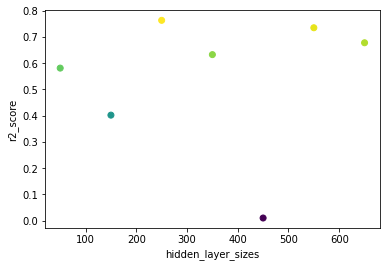

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor

score =[]
layersizelist = []
score_max =0
layersize_max =0
for i in range(50,700,100):
  est = MLPRegressor(hidden_layer_sizes=(i), 
                    activation="tanh", # 'logistic', 'relu'
                    learning_rate_init=0.001,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)

  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("hidden_layer_sizes: " , i, " =>",r2_score(MLP_y_test,MLP_y_pred))

print("Best hidden_layer_sizes: " , layersize_max, " =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

After running, i think that the number of node works good is around 200 and 300, So i scale the range and test again with new range from 150 to 300

hidden_layer_sizes:  150  => 0.22542476793607014
hidden_layer_sizes:  170  => 0.6271631904339312
hidden_layer_sizes:  190  => 0.0017386876847983457
hidden_layer_sizes:  210  => 0.7463034884556459
hidden_layer_sizes:  230  => 0.5504711846701278
hidden_layer_sizes:  250  => 0.476309290992715
hidden_layer_sizes:  270  => 0.7129630948124689
hidden_layer_sizes:  290  => 0.7002560509553225
Best hidden_layer_sizes:  210  => 0.7463034884556459


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Text(0, 0.5, 'r2_score')

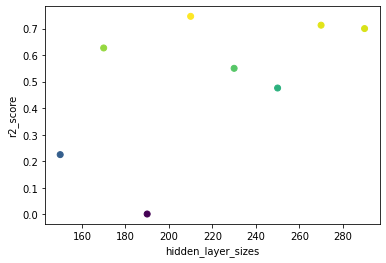

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor



score =[]
layersizelist = []
score_max =0
layersize_max =0
for i in range(150,300,20):
  est = MLPRegressor(hidden_layer_sizes=(i), 
                    activation="tanh", # 'logistic', 'relu'
                    learning_rate_init=0.001,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)

  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("hidden_layer_sizes: " , i, " =>",r2_score(MLP_y_test,MLP_y_pred))

print("Best hidden_layer_sizes: " , layersize_max, " =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

As  i think, the perform between 200 nodes and 300 node have a good result, So i pick the best record above nodes: 210 for later test

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.1  => 0.06187090611109902


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.2  => 0.3124123540966841


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.30000000000000004  => 0.3446831740695905


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.4  => 0.060034685525068965
learning_rate_init:  0.5  => -0.1262511074554331


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.6  => 0.4031366053172005


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.7000000000000001  => 0.12310853394990728


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.8  => 0.014392080279557407


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  0.9  => 4.509360839988208e-05


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  1.0  => 0.20265707082807338


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  1.1  => 0.32060786405248776
learning_rate_init:  1.2000000000000002  => 0.06101215664549975
learning_rate_init:  1.3000000000000003  => 0.01587342252655377
learning_rate_init:  1.4000000000000001  => 0.19950739630292558
learning_rate_init:  1.5000000000000002  => 0.277597564733032


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  1.6  => 0.3039061796193747


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  1.7000000000000002  => 0.031086691318574333
learning_rate_init:  1.8000000000000003  => 0.08188756482358717
learning_rate_init:  1.9000000000000001  => 0.23856989475774792
learning_rate_init:  2.0  => 0.43601539031918113


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.1  => 0.020549097631729407
learning_rate_init:  2.2  => 0.15256620401660026


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.3000000000000003  => 0.01845207854857267


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.4000000000000004  => 0.003981547474011915
learning_rate_init:  2.5000000000000004  => 0.00829153623384693
learning_rate_init:  2.6  => -0.00034892753022308653
learning_rate_init:  2.7  => 0.2871436334936692


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.8000000000000003  => 0.06874279010124096


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.9000000000000004  => 0.00346696707548666
learning_rate_init:  3.0000000000000004  => 0.12463996928174059
Best learning_rate_init:  2.0  => 0.43601539031918113


Text(0, 0.5, 'r2_score')

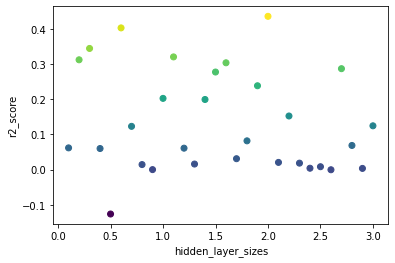

In [ ]:


from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor



score =[]
layersizelist = []
score_max =0
layersize_max = 0
learningRateMLP = [0.0001, 0.001, 0.01, 0.1, 1.0]
for i in np.arange(0.1,3.1,0.1):
  est = MLPRegressor(hidden_layer_sizes=(10), 
                    activation="tanh", # 'logistic', 'relu'
                    learning_rate_init=i,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)

  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("learning_rate_init: " ,i, " =>",r2_score(MLP_y_test,MLP_y_pred))

print("Best learning_rate_init: " , layersize_max, " =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  200   activation : Relu =>  0.8615651522411919


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  210   activation : Relu =>  0.8620487576201599


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  220   activation : Relu =>  0.865673256710707


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  230   activation : Relu =>  0.8637234506290978


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


hidden_layer_sizes:  240   activation : Relu =>  0.8640425139688854
hidden_layer_sizes:  250   activation : Relu =>  0.8506943108008695
Best hidden_layer_sizes:  220   activation : Relu => 0.865673256710707


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Text(0, 0.5, 'r2_score')

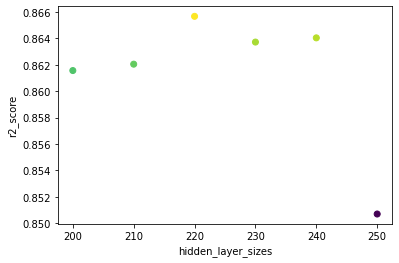

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
score =[]
layersizelist = []
score_max =0
layersize_max =0
for i in range(200,260,10):
  est = MLPRegressor(hidden_layer_sizes=(i), 
                    activation="relu", # 'logistic', 'tanh'
                    learning_rate_init=0.001,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)

  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("hidden_layer_sizes: " , i, "  activation : Relu => ",r2_score(MLP_y_test,MLP_y_pred))

print("Best hidden_layer_sizes: " , layersize_max, "  activation : Relu =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

learning_rate_init:  0.1  => 0.8392557821033724
learning_rate_init:  0.2  => 0.8574853516154978
learning_rate_init:  0.3  => 0.8484564545736966
learning_rate_init:  0.4  => 0.8077328936134937
learning_rate_init:  0.5  => 0.8686583701352224
learning_rate_init:  0.6  => 0.8518529997380584
learning_rate_init:  0.7  => 0.8573234141189526
learning_rate_init:  0.8  => 0.8365291242246473
learning_rate_init:  0.9  => 0.8402305100181903
learning_rate_init:  1.0  => 0.8362962309397289
learning_rate_init:  1.1  => 0.8542269438903763
learning_rate_init:  1.2  => 0.8522206236596901
learning_rate_init:  1.3  => 0.840997581073203


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  1.4  => 0.8638033199242972
learning_rate_init:  1.5  => 0.8367853909159795
learning_rate_init:  1.6  => 0.8138984150515499
learning_rate_init:  1.7  => 0.8623737404196983
learning_rate_init:  1.8  => 0.8358276834026414
learning_rate_init:  1.9  => 0.8314791594814881
learning_rate_init:  2.0  => 0.8418096077327483


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.1  => 0.8413283366348127
learning_rate_init:  2.2  => 0.8601561129075517
learning_rate_init:  2.3  => 0.851964961972093
learning_rate_init:  2.4  => 0.8465841023610823
learning_rate_init:  2.5  => 0.8415898054355925
learning_rate_init:  2.6  => 0.8708741700808874
learning_rate_init:  2.7  => 0.8614805791490958
learning_rate_init:  2.8  => 0.8440552828552639


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


learning_rate_init:  2.9  => 0.8701882630763756
learning_rate_init:  3.0  => 0.839791933149815
Best learning_rate_init:  2.6  => 0.8708741700808874


Text(0, 0.5, 'r2_score')

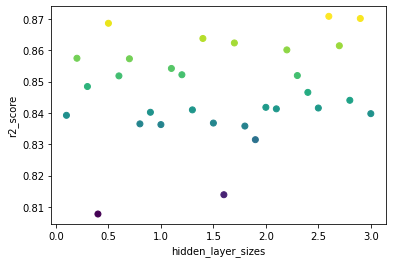

In [ ]:

from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor

score =[]
layersizelist = []
score_max =0
layersize_max = 0
for i in np.arange(0.1,3.1,0.1):
  est = MLPRegressor(hidden_layer_sizes=(10), 
                    activation="relu", # 'logistic', 'tanh'
                    learning_rate_init=i,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)
  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("learning_rate_init: " ,round(i,1), " =>",r2_score(MLP_y_test,MLP_y_pred))

print("Best learning_rate_init: " , layersize_max, " =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

In [ ]:

from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor

score =[]
layersizelist = []
score_max =0
layersize_max = 0
for i in np.arange(0.1,3.1,0.1):
  est = MLPRegressor(hidden_layer_sizes=(10), 
                    activation="relu", # 'logistic', 'tanh'
                    learning_rate_init=i,
                    alpha=10
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=10000,
                    warm_start=False)
  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  score.append(r2_score(MLP_y_test,MLP_y_pred))
  layersizelist.append(i)
  if(score_max<r2_score(MLP_y_test,MLP_y_pred)):
    score_max=r2_score(MLP_y_test,MLP_y_pred)
    layersize_max=i
  print("learning_rate_init: " ,round(i,1), " =>",r2_score(MLP_y_test,MLP_y_pred))

print("Best learning_rate_init: " , layersize_max, " =>",score_max)
plt.scatter(layersizelist,score, c=score)
plt.xlabel('hidden_layer_sizes')
plt.ylabel('r2_score')

The result of relu activation is better than logistic sigmoid and tanh

Final decision to test with MLP: hidden_layer_sizes = 260 -300 , activation =relu (default), learning_rate_init=0.1 

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor



score =[]
layersizelist = []
score_max =0
layersize_max =0
est = MLPRegressor(hidden_layer_sizes=(210), 
                  activation="relu", # 'logistic', 'relu'
                  learning_rate_init=0.1,
                  alpha=10
                  ,solver='lbfgs' #'sgd', 'adam'
                  ,max_iter=10000,
                  warm_start=False)

est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
MLP_y_pred = est.predict(MLP_X_test)
print("Best hidden_layer_sizes: " , layersize_max, " =>",score_max)


Best hidden_layer_sizes:  0  => 0


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint
# Number of hidden_layer_size
hidden_layer_sizes =  [int(x) for x in range(200,310,10)]
# Number of learning_rate_init 
learning_rate_sizes = [0.6, 2]
# Strength of the L2 regularization term
alpha_sizes = [0.01,1,10]
# max_iter
max_iter_size = [500,1000,10000]

random_grid = {'hidden_layer_sizes': hidden_layer_sizes,
               'learning_rate_init': learning_rate_sizes,
               'alpha': alpha_sizes,
               'max_iter': max_iter_size}
pprint(random_grid)


est = MLPRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
est_random = RandomizedSearchCV(estimator = est, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
est_random.fit(gra_X_train, np.ravel(gra_y_train,order='C'))

{'alpha': [0.01, 1, 10],
 'hidden_layer_sizes': [200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300],
 'learning_rate_init': [0.6, 2],
 'max_iter': [500, 1000, 10000]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=MLPRegressor(), n_iter=100, n_jobs=-1,
                   param_distributions={'alpha': [0.01, 1, 10],
                                        'hidden_layer_sizes': [200, 210, 220,
                                                               230, 240, 250,
                                                               260, 270, 280,
                                                               290, 300],
                                        'learning_rate_init': [0.6, 2],
                                        'max_iter': [500, 1000, 10000]},
                   random_state=42, verbose=2)

In [ ]:
# check the best combination of parameter
est_random.best_params_

{'max_iter': 1000,
 'learning_rate_init': 0.6,
 'hidden_layer_sizes': 230,
 'alpha': 0.01}

In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor

for i in range(1,10,1):
  est = MLPRegressor(hidden_layer_sizes=(230), 
                    activation="relu", # 'logistic', 'relu'
                    learning_rate_init=0.6,
                    alpha=0.01
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=1000,
                    warm_start=False)

  est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
  MLP_y_pred = est.predict(MLP_X_test)
  print("MLPRegressor R-square Scpre: =>",r2_score(MLP_y_test,MLP_y_pred))


In [ ]:
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor


est = MLPRegressor(hidden_layer_sizes=(230), 
                    activation="relu", # 'logistic', 'relu'
                    learning_rate_init=0.6,
                    alpha=0.01
                    ,solver='lbfgs' #'sgd', 'adam'
                    ,max_iter=1000,
                    warm_start=False)

est.fit(MLP_X_train, np.ravel(MLP_y_train,order='C'))
MLP_y_pred = est.predict(MLP_X_test)
print("MLPRegressor R-square Scpre: =>",r2_score(MLP_y_test,MLP_y_pred))

MLPRegressor R-square Scpre: => 0.853661072544327


/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
